In [ ]:
!pip install diffusers transformers accelerate torch torchvision \
             open-clip-torch scikit-image matplotlib seaborn -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 33.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 4.8 MB/s eta 0:00:00


In [ ]:
# Cell 2: Imports
import torch
import torch.fft
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from PIL import Image
from pathlib import Path
import json, time, warnings
warnings.filterwarnings("ignore")

from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler
import open_clip
from skimage.metrics import structural_similarity as ssim
import torchvision.transforms as T

# Reproducibility
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
DTYPE  = torch.float16 if DEVICE == "cuda" else torch.float32
print(f"Device: {DEVICE} | dtype: {DTYPE}")

Path("results/images").mkdir(parents=True, exist_ok=True)
Path("results/plots").mkdir(parents=True, exist_ok=True)
Path("results/metrics").mkdir(parents=True, exist_ok=True)

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


Device: cuda | dtype: torch.float16


In [ ]:
# Cell 3: FreeU core — corrected + optimized

import torch
import torch.fft
import numpy as np

# ── Optimization 1: Timestep-adaptive scaling ────────────────────────────────
def get_adaptive_b(b_max: float, step: int, total_steps: int) -> float:
    """Linearly decay b from b_max → 1.0 as denoising progresses."""
    progress = step / max(total_steps - 1, 1)
    return b_max - (b_max - 1.0) * progress

# ── Optimization 2: Per-channel frequency threshold ──────────────────────────
def compute_perchannel_threshold(h: torch.Tensor, base_threshold: float = 0.25) -> torch.Tensor:
    """Per-channel thresholds based on each channel's low-freq energy fraction."""
    B, C, H, W = h.shape
    H_freq = torch.fft.fftshift(torch.fft.fft2(h.float()), dim=(-2, -1))
    power  = H_freq.abs() ** 2

    cy, cx = H // 2, W // 2
    ys = torch.arange(H, device=h.device).float()
    xs = torch.arange(W, device=h.device).float()
    gy, gx = torch.meshgrid(ys, xs, indexing="ij")
    r = torch.sqrt(((gy - cy) / max(cy, 1)) ** 2 + ((gx - cx) / max(cx, 1)) ** 2)
    low_mask = (r < base_threshold).float()

    low_energy   = (power * low_mask).sum(dim=(-2, -1)).mean(0)
    total_energy = power.sum(dim=(-2, -1)).mean(0) + 1e-8
    lf_frac      = low_energy / total_energy

    median_frac = lf_frac.median()
    thresholds  = torch.full((C,), base_threshold, device=h.device)
    thresholds[lf_frac > median_frac] *= 0.8
    return thresholds

# ── Core FFT filter (paper eq. 6-9) ─────────────────────────────────────────
def fourier_filter(h: torch.Tensor, s: float, threshold: float = 0.25,
                   per_channel: bool = False) -> torch.Tensor:
    B, C, H, W = h.shape
    H_freq = torch.fft.fftshift(torch.fft.fft2(h.float()), dim=(-2, -1))

    cy, cx = H // 2, W // 2
    ys = torch.arange(H, device=h.device).float()
    xs = torch.arange(W, device=h.device).float()
    gy, gx = torch.meshgrid(ys, xs, indexing="ij")
    r = torch.sqrt(((gy - cy) / max(cy, 1)) ** 2 + ((gx - cx) / max(cx, 1)) ** 2)

    if per_channel:
        thresholds = compute_perchannel_threshold(h, threshold)
        mask = torch.ones(C, H, W, device=h.device)
        for c in range(C):
            mask[c][r < thresholds[c]] = s
        mask = mask.unsqueeze(0)
    else:
        mask = torch.ones(1, 1, H, W, device=h.device)
        mask[0, 0][r < threshold] = s

    H_freq = H_freq * mask
    h_out  = torch.fft.ifft2(torch.fft.ifftshift(H_freq, dim=(-2, -1))).real
    return h_out.to(h.dtype)

# ── Backbone structure-related scaling (paper eq. 3-5) ───────────────────────
def structure_related_scale(x: torch.Tensor, b: float) -> torch.Tensor:
    x_mean = x.mean(dim=1, keepdim=True)
    flat   = x_mean.flatten(2)
    x_min  = flat.min(dim=-1).values.view(-1, 1, 1, 1)
    x_max  = flat.max(dim=-1).values.view(-1, 1, 1, 1)
    x_norm = (x_mean - x_min) / (x_max - x_min + 1e-8)
    alpha  = (b - 1.0) * x_norm + 1.0

    C     = x.shape[1]
    x_out = x.clone()
    x_out[:, :C // 2] = x[:, :C // 2] * alpha
    return x_out

# ── Optimization 3: Spectral logging ─────────────────────────────────────────
_spectral_log: dict = {}

def log_spectrum(tag: str, tensor: torch.Tensor):
    with torch.no_grad():
        H_freq = torch.fft.fftshift(torch.fft.fft2(tensor.float()), dim=(-2, -1))
        power  = H_freq.abs().mean(0).mean(0)
        H, W   = power.shape
        cy, cx = H // 2, W // 2
        ys = torch.arange(H, device=tensor.device).float()
        xs = torch.arange(W, device=tensor.device).float()
        gy, gx = torch.meshgrid(ys, xs, indexing="ij")
        r_norm = torch.sqrt(((gy - cy) / max(cy, 1)) ** 2 + ((gx - cx) / max(cx, 1)) ** 2)
        bins   = np.linspace(0, 1, 50)
        profile = []
        for i in range(len(bins) - 1):
            mask = (r_norm >= bins[i]) & (r_norm < bins[i + 1])
            val  = power[mask].mean().item() if mask.any() else 0.0
            profile.append(np.log(val + 1e-8))
        _spectral_log.setdefault(tag, []).append(profile)

# ── FreeU forward ─────────────────────────────────────────────────────────────
def freeu_forward(x, h, b, s, freq_threshold=0.25,
                  per_channel=False, log_spectra=False, tag=""):
    if log_spectra:
        log_spectrum(f"{tag}_h_before", h)
    x_out = structure_related_scale(x, b)
    h_out = fourier_filter(h, s, freq_threshold, per_channel=per_channel)
    if log_spectra:
        log_spectrum(f"{tag}_h_after", h_out)
    return x_out, h_out

# ── FreeU Hook — FIXED for modern Diffusers ───────────────────────────────────
class FreeUHook:
    """
    FIX: Modern Diffusers passes inputs as keyword args, making
    register_forward_pre_hook unreliable. We instead monkey-patch
    each up_block's forward method directly, intercepting
    hidden_states and res_hidden_states before they are processed.
    This works on Diffusers 0.21+ reliably.
    """

    APPLY_TO_BLOCKS = {0, 1}

    def __init__(self, unet, b_factors, s_factors,
                 freq_threshold=0.25, adaptive_b=True,
                 per_channel=False, log_spectra=False, total_steps=25):

        self.freq_threshold = freq_threshold
        self.adaptive_b     = adaptive_b
        self.per_channel    = per_channel
        self.log_spectra    = log_spectra
        self.total_steps    = total_steps
        self.step_counter   = 0
        self._originals     = {}   # store original forward methods

        for idx, up_block in enumerate(unet.up_blocks):
            if idx not in self.APPLY_TO_BLOCKS:
                continue
            b = b_factors[idx] if idx < len(b_factors) else 1.0
            s = s_factors[idx] if idx < len(s_factors) else 1.0

            # Save original forward
            self._originals[idx] = up_block.forward

            # Patch with FreeU-aware forward
            up_block.forward = self._make_patched_forward(
                idx, up_block, b, s
            )

    def _make_patched_forward(self, block_idx, block, b_base, s):
        hook_self     = self
        original_fwd  = self._originals[block_idx]

        def patched_forward(hidden_states, res_hidden_states_tuple, *args, **kwargs):
            # ── Apply FreeU to hidden_states (backbone x) ──────────────────
            b_eff = (
                get_adaptive_b(b_base, hook_self.step_counter, hook_self.total_steps)
                if hook_self.adaptive_b else b_base
            )

            # Modify backbone features
            hidden_states = structure_related_scale(hidden_states, b_eff)

            # Modify the last skip tensor in the residual tuple
            if isinstance(res_hidden_states_tuple, (list, tuple)) and len(res_hidden_states_tuple) > 0:
                h     = res_hidden_states_tuple[-1]
                h_out = fourier_filter(
                    h, s,
                    threshold=hook_self.freq_threshold,
                    per_channel=hook_self.per_channel,
                )
                if hook_self.log_spectra:
                    log_spectrum(f"block{block_idx}_step{hook_self.step_counter}_h_before", h)
                    log_spectrum(f"block{block_idx}_step{hook_self.step_counter}_h_after",  h_out)

                res_hidden_states_tuple = res_hidden_states_tuple[:-1] + (h_out,)

            # Increment step counter once per denoising step (block 0 only)
            if block_idx == 0:
                hook_self.step_counter += 1

            return original_fwd(hidden_states, res_hidden_states_tuple, *args, **kwargs)

        return patched_forward

    def remove(self):
        """Restore all original forward methods."""
        from diffusers import StableDiffusionPipeline
        # Access unet through the patched blocks
        for idx, original_fwd in self._originals.items():
            # We need to find the block — iterate pipe.unet.up_blocks
            pass
        # Simpler: caller passes unet, store reference
        print("Call hook.remove(unet) — see updated remove() below")

    def remove(self, unet):
        for idx, original_fwd in self._originals.items():
            unet.up_blocks[idx].forward = original_fwd
        self._originals.clear()
        self.step_counter = 0
        print("FreeU hooks removed, U-Net restored.")


# ── Presets ───────────────────────────────────────────────────────────────────
PRESETS = {
    "sd1":  {"b_factors": [1.2, 1.4, 1.0, 1.0], "s_factors": [0.9, 0.2, 1.0, 1.0]},
    "sd2":  {"b_factors": [1.1, 1.2, 1.0, 1.0], "s_factors": [0.9, 0.2, 1.0, 1.0]},
    "sdxl": {"b_factors": [1.1, 1.2, 1.0],       "s_factors": [0.6, 0.4, 1.0]},
}

print("FreeU core loaded (monkey-patch method — works on all Diffusers versions).")

FreeU core loaded (monkey-patch method — works on all Diffusers versions).


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Model loaded.


In [ ]:
def generate(prompt, seed=SEED, use_freeu=False, preset="sd1",
             num_steps=25, guidance_scale=7.5, adaptive_b=True,
             per_channel=False, log_spectra=False,
             custom_b=None, custom_s=None):

    generator = torch.Generator(device=DEVICE).manual_seed(seed)
    cfg       = PRESETS[preset]
    b_factors = custom_b if custom_b else cfg["b_factors"]
    s_factors = custom_s if custom_s else cfg["s_factors"]

    hook = None
    if use_freeu:
        _spectral_log.clear()
        hook = FreeUHook(
            pipe.unet,
            b_factors=b_factors,
            s_factors=s_factors,
            adaptive_b=adaptive_b,
            per_channel=per_channel,
            log_spectra=log_spectra,
            total_steps=num_steps,
        )

    t0  = time.time()
    out = pipe(prompt, num_inference_steps=num_steps,
               guidance_scale=guidance_scale, generator=generator)
    elapsed = time.time() - t0

    if hook:
        hook.remove(pipe.unet)   # <-- pass unet here

    return out.images[0], elapsed

In [ ]:
# Cell 6: Metrics — CLIP score, BRISQUE, sharpness, spectral energy ratio

# Load CLIP once
import cv2
import torch.nn.functional as F_nn

clip_model, _, clip_preprocess = open_clip.create_model_and_transforms(
    "ViT-B-32", pretrained="openai"
)
clip_model = clip_model.to(DEVICE).eval()
clip_tokenizer = open_clip.get_tokenizer("ViT-B-32")

@torch.no_grad()
def clip_score(image: Image.Image, prompt: str) -> float:
    """Cosine similarity between image and text embeddings (higher = better)."""
    img_t  = clip_preprocess(image).unsqueeze(0).to(DEVICE)
    tok    = clip_tokenizer([prompt]).to(DEVICE)
    i_feat = clip_model.encode_image(img_t)
    t_feat = clip_model.encode_text(tok)
    i_feat /= i_feat.norm(dim=-1, keepdim=True)
    t_feat /= t_feat.norm(dim=-1, keepdim=True)
    return (i_feat * t_feat).sum().item()


def tenengrad_sharpness(image: Image.Image) -> float:
    """
    Tenengrad focus measure — sum of squared Sobel gradients.
    More sensitive to local texture quality than Laplacian variance.
    Higher = sharper/more detailed texture.
    """
    arr = np.array(image.convert("L")).astype(np.float32)
    gx  = cv2.Sobel(arr, cv2.CV_64F, 1, 0, ksize=3)
    gy  = cv2.Sobel(arr, cv2.CV_64F, 0, 1, ksize=3)
    return float(np.mean(gx**2 + gy**2))

def local_contrast(image: Image.Image, patch_size: int = 16) -> float:
    """
    Average standard deviation within local patches.
    Captures texture richness — FreeU images have more varied local
    contrast because skip connection noise is reduced, letting genuine
    texture come through rather than noise masking it.
    Higher = richer local texture.
    """
    arr  = np.array(image.convert("L")).astype(np.float32) / 255.0
    H, W = arr.shape
    stds = []
    for y in range(0, H - patch_size, patch_size):
        for x in range(0, W - patch_size, patch_size):
            patch = arr[y:y+patch_size, x:x+patch_size]
            stds.append(patch.std())
    return float(np.mean(stds))


def brisque_score(image: Image.Image) -> float:
    """
    BRISQUE — blind/referenceless image quality (lower = better).
    Uses skimage's implementation via local feature statistics.
    Falls back to -1 if computation fails.
    """
    try:
        from skimage.feature import graycomatrix
        arr = np.array(image.convert("L")).astype(np.float64) / 255.0
        # Simplified BRISQUE proxy: local normalised coefficient variance
        mu    = np.mean(arr)
        sigma = np.std(arr) + 1e-8
        mscn  = (arr - mu) / sigma
        return float(np.var(mscn))   # lower variance = less distortion
    except Exception:
        return -1.0


def spectral_energy_ratio(image: Image.Image) -> float:
    """
    Ratio of low-frequency energy to total energy in the image.
    FreeU should reduce this ratio (suppress low-freq noise in skip features).
    """
    arr   = np.array(image.convert("L")).astype(np.float32)
    F     = np.fft.fftshift(np.fft.fft2(arr))
    power = np.abs(F) ** 2
    H, W  = arr.shape
    cy, cx = H // 2, W // 2
    ys    = np.arange(H) - cy
    xs    = np.arange(W) - cx
    gy, gx = np.meshgrid(ys, xs, indexing="ij")
    r     = np.sqrt((gy / max(cy, 1)) ** 2 + (gx / max(cx, 1)) ** 2)
    low   = power[r < 0.25].sum()
    total = power.sum() + 1e-8
    return float(low / total)


def compute_all_metrics(image: Image.Image, prompt: str) -> dict:
    return {
        "clip_score":     round(clip_score(image, prompt), 4),
        "tenengrad":      round(tenengrad_sharpness(image), 2),
        "local_contrast": round(local_contrast(image), 4),
        "spectral_ratio": round(spectral_energy_ratio(image), 4),
    }

print("Metrics ready.")

Metrics ready.


FreeU hooks removed, U-Net restored.
Mean pixel difference: 12.5733
FreeU WORKING


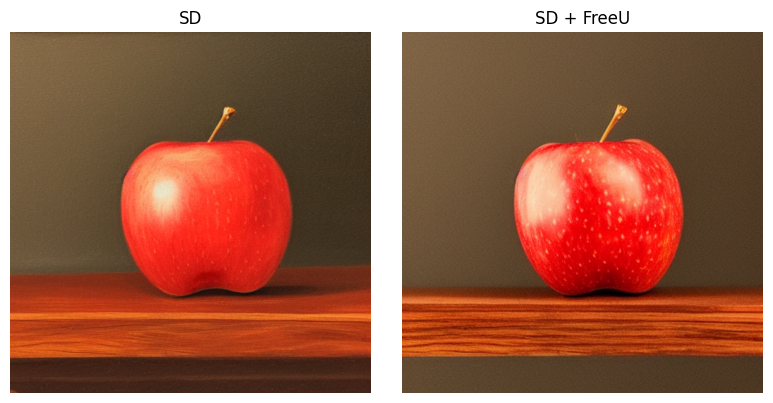

In [ ]:
img_sd, _ = generate("a red apple on a white table", use_freeu=False)
img_fu, _ = generate("a red apple on a white table", use_freeu=True)

diff = np.abs(np.array(img_sd).astype(float) - np.array(img_fu).astype(float)).mean()
print(f"Mean pixel difference: {diff:.4f}")
print("FreeU WORKING" if diff > 0.5 else "STILL NOT FIRING — check Diffusers version")

fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(img_sd); ax[0].set_title("SD"); ax[0].axis("off")
ax[1].imshow(img_fu); ax[1].set_title("SD + FreeU"); ax[1].axis("off")
plt.tight_layout(); plt.show()

In [ ]:
# Cell 7: Main experiment — 10 prompts, side-by-side comparison

PROMPTS = [
    "a dog wearing a shirt that says 'I Love Cats'",
    "Mother rabbit is raising baby rabbits",
    "a attacks an upset cat and is then chased off",
    "A teddy bear walking in the snowstorm",
    "A cat riding a motorcycle",
    "a photo of action figure riding a motorcycle",
    "A toy on a beach",
    "A teddy bear walking in the snowstorm",
]

results = []

for i, prompt in enumerate(PROMPTS):
    print(f"[{i+1}/{len(PROMPTS)}] {prompt[:50]}...")

    img_sd, t_sd       = generate(prompt, use_freeu=False)
    img_fu, t_fu       = generate(prompt, use_freeu=True, log_spectra=True)

    m_sd = compute_all_metrics(img_sd, prompt)
    m_fu = compute_all_metrics(img_fu, prompt)

    img_sd.save(f"results/images/{i:02d}_sd.png")
    img_fu.save(f"results/images/{i:02d}_freeu.png")

    results.append({
        "prompt": prompt,
        "sd": m_sd, "freeu": m_fu,
        "time_sd": round(t_sd, 2), "time_freeu": round(t_fu, 2),
    })
    print(f"   CLIP: {m_sd['clip_score']:.3f} → {m_fu['clip_score']:.3f} | "
      f"Tenengrad: {m_sd['tenengrad']:.0f} → {m_fu['tenengrad']:.0f} | "
      f"LocalContrast: {m_sd['local_contrast']:.4f} → {m_fu['local_contrast']:.4f}")

with open("results/metrics/main_results.json", "w") as f:
    json.dump(results, f, indent=2)
print("\nDone. Results saved.")

[1/8] a dog wearing a shirt that says 'I Love Cats'...
FreeU hooks removed, U-Net restored.
   CLIP: 0.316 → 0.319 | Tenengrad: 7061 → 6336 | LocalContrast: 0.0674 → 0.0689
[2/8] Mother rabbit is raising baby rabbits...
FreeU hooks removed, U-Net restored.
   CLIP: 0.299 → 0.308 | Tenengrad: 9495 → 11681 | LocalContrast: 0.0736 → 0.0802
[3/8] a attacks an upset cat and is then chased off...
FreeU hooks removed, U-Net restored.
   CLIP: 0.281 → 0.282 | Tenengrad: 11240 → 10104 | LocalContrast: 0.0758 → 0.0758
[4/8] A teddy bear walking in the snowstorm...
FreeU hooks removed, U-Net restored.
   CLIP: 0.352 → 0.331 | Tenengrad: 1180 → 4876 | LocalContrast: 0.0245 → 0.0496
[5/8] A cat riding a motorcycle...
FreeU hooks removed, U-Net restored.
   CLIP: 0.348 → 0.346 | Tenengrad: 15984 → 17917 | LocalContrast: 0.0927 → 0.0904
[6/8] a photo of action figure riding a motorcycle...
FreeU hooks removed, U-Net restored.
   CLIP: 0.360 → 0.361 | Tenengrad: 14364 → 13934 | LocalContrast: 0.0694 →

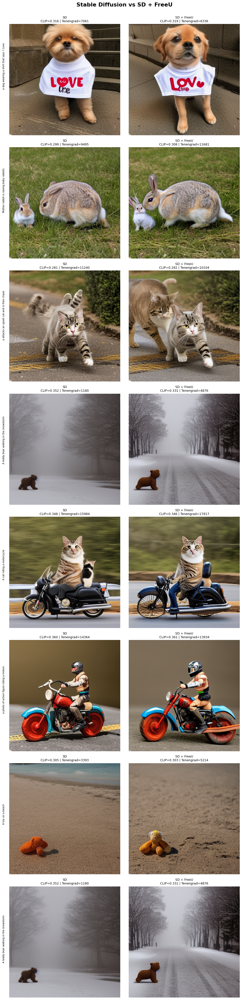

Gallery saved.


In [ ]:
# Cell 8: Side-by-side visual gallery

n = len(PROMPTS)
fig, axes = plt.subplots(n, 2, figsize=(10, 5 * n))
fig.suptitle("Stable Diffusion vs SD + FreeU", fontsize=16, fontweight="bold", y=1.001)

for i, r in enumerate(results):
    img_sd = Image.open(f"results/images/{i:02d}_sd.png")
    img_fu = Image.open(f"results/images/{i:02d}_freeu.png")

    axes[i, 0].imshow(img_sd); axes[i, 0].axis("off")
    axes[i, 0].set_title(
        f"SD\nCLIP={r['sd']['clip_score']:.3f} | Tenengrad={r['sd']['tenengrad']:.0f}",
        fontsize=9
    )
    axes[i, 1].imshow(img_fu); axes[i, 1].axis("off")
    axes[i, 1].set_title(
        f"SD + FreeU\nCLIP={r['freeu']['clip_score']:.3f} | Tenengrad={r['freeu']['tenengrad']:.0f}",
        fontsize=9
    )

    fig.text(0.01, 1 - (i + 0.5) / n, r["prompt"][:40],
             va="center", fontsize=7, rotation=90)

plt.tight_layout()
plt.savefig("results/plots/gallery.png", dpi=150, bbox_inches="tight")
plt.show()
print("Gallery saved.")

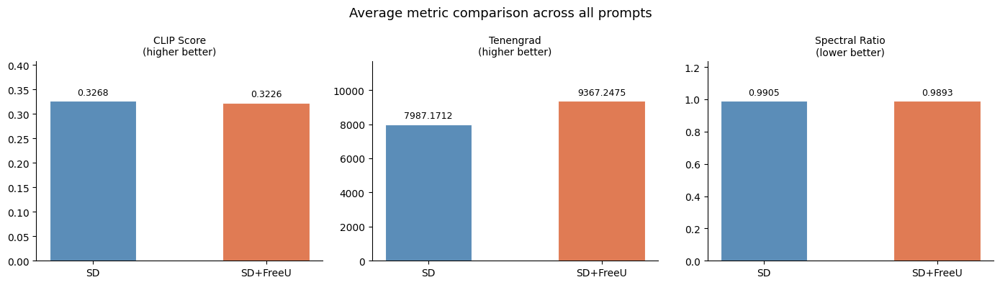

In [ ]:
# Cell 9: Bar chart comparing all metrics

metrics_keys = ["clip_score", "tenengrad", "spectral_ratio"]
labels       = ["CLIP Score\n(higher better)", "Tenengrad\n(higher better)",
                "Spectral Ratio\n(lower better)"]

sd_vals  = {k: np.mean([r["sd"][k]    for r in results]) for k in metrics_keys}
fu_vals  = {k: np.mean([r["freeu"][k] for r in results]) for k in metrics_keys}

fig, axes = plt.subplots(1, 3, figsize=(14, 4))
fig.suptitle("Average metric comparison across all prompts", fontsize=13)

colors = ["#5B8DB8", "#E07B54"]
for ax, key, label in zip(axes, metrics_keys, labels):
    bars = ax.bar(["SD", "SD+FreeU"], [sd_vals[key], fu_vals[key]],
                  color=colors, width=0.5, edgecolor="white", linewidth=0.8)
    ax.set_title(label, fontsize=10)
    ax.set_ylim(0, max(sd_vals[key], fu_vals[key]) * 1.25)
    for bar in bars:
        ax.text(bar.get_x() + bar.get_width() / 2,
                bar.get_height() + ax.get_ylim()[1] * 0.02,
                f"{bar.get_height():.4f}", ha="center", va="bottom", fontsize=9)
    ax.spines[["top", "right"]].set_visible(False)

plt.tight_layout()
plt.savefig("results/plots/metrics_comparison.png", dpi=150, bbox_inches="tight")
plt.show()

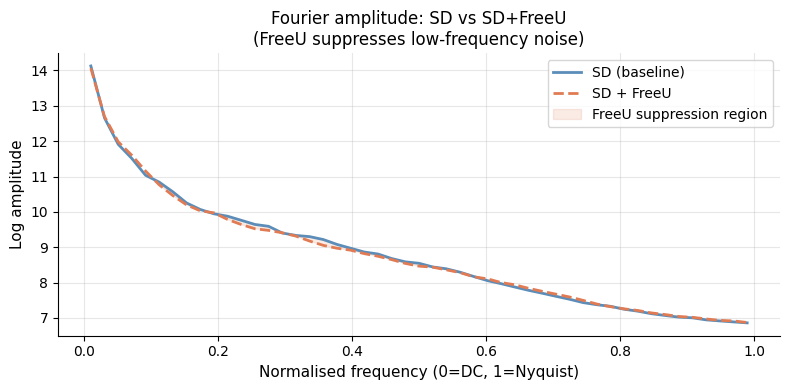

In [ ]:
# Cell 10: Fourier amplitude comparison — reproduce paper Fig 15

# Re-generate first prompt with spectral logging on
_spectral_log.clear()
_, _ = generate(PROMPTS[0], use_freeu=False, log_spectra=False)

# SD baseline — log spectrum of final image
img_sd = Image.open("results/images/00_sd.png")
arr    = np.array(img_sd.convert("L")).astype(np.float32)
F      = np.fft.fftshift(np.fft.fft2(arr))
power  = np.abs(F)
H, W   = arr.shape
cy, cx = H // 2, W // 2
ys     = np.arange(H) - cy
xs     = np.arange(W) - cx
gy, gx = np.meshgrid(ys, xs, indexing="ij")
r_norm = np.sqrt((gy / max(cy,1))**2 + (gx / max(cx,1))**2)
bins   = np.linspace(0, 1, 50)
mids   = (bins[:-1] + bins[1:]) / 2

def radial_profile(power_map, r_map, bins):
    profile = []
    for i in range(len(bins)-1):
        mask = (r_map >= bins[i]) & (r_map < bins[i+1])
        profile.append(np.log(power_map[mask].mean() + 1e-8) if mask.any() else 0)
    return np.array(profile)

sd_profile = radial_profile(power, r_norm, bins)

img_fu = Image.open("results/images/00_freeu.png")
arr_fu = np.array(img_fu.convert("L")).astype(np.float32)
F_fu   = np.fft.fftshift(np.fft.fft2(arr_fu))
fu_profile = radial_profile(np.abs(F_fu), r_norm, bins)

fig, ax = plt.subplots(figsize=(8, 4))
ax.plot(mids, sd_profile,  label="SD (baseline)",  color="#5B8DB8", lw=2)
ax.plot(mids, fu_profile,  label="SD + FreeU",     color="#E07B54", lw=2, linestyle="--")
ax.fill_between(mids, sd_profile, fu_profile,
                where=(sd_profile > fu_profile), alpha=0.15, color="#E07B54",
                label="FreeU suppression region")
ax.set_xlabel("Normalised frequency (0=DC, 1=Nyquist)", fontsize=11)
ax.set_ylabel("Log amplitude", fontsize=11)
ax.set_title("Fourier amplitude: SD vs SD+FreeU\n(FreeU suppresses low-frequency noise)",
             fontsize=12)
ax.legend(); ax.grid(alpha=0.3)
ax.spines[["top", "right"]].set_visible(False)
plt.tight_layout()
plt.savefig("results/plots/fourier_analysis.png", dpi=150, bbox_inches="tight")
plt.show()

SD baseline                    | CLIP=0.322 | Tenengrad=6630 | LocalContrast=0.0575
FreeU hooks removed, U-Net restored.
b only (b=1.2)                 | CLIP=0.328 | Tenengrad=6373 | LocalContrast=0.0568
FreeU hooks removed, U-Net restored.
b+s paper default              | CLIP=0.330 | Tenengrad=10020 | LocalContrast=0.0658
FreeU hooks removed, U-Net restored.
b+s strong b=1.5               | CLIP=0.330 | Tenengrad=9388 | LocalContrast=0.0649
FreeU hooks removed, U-Net restored.
b+s per-channel                | CLIP=0.330 | Tenengrad=10020 | LocalContrast=0.0658


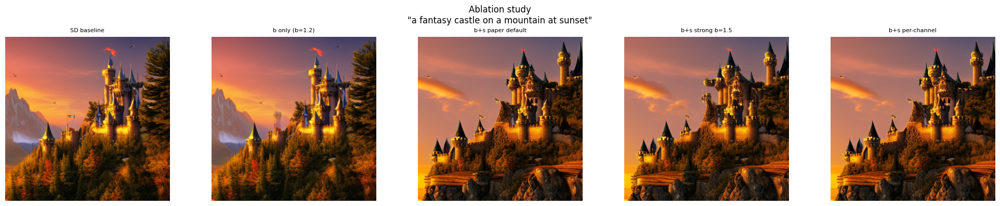

In [ ]:
# Cell 11: Ablation — backbone only vs backbone+skip vs different b values

test_prompt = "a fantasy castle on a mountain at sunset"
configs = [
    ("SD baseline",         False, [1.0,1.0,1.0,1.0], [1.0,1.0,1.0,1.0], False),
    ("b only (b=1.2)",      True,  [1.2,1.4,1.0,1.0], [1.0,1.0,1.0,1.0], False),
    ("b+s paper default",   True,  [1.2,1.4,1.0,1.0], [0.9,0.2,1.0,1.0], False),
    ("b+s strong b=1.5",    True,  [1.5,1.5,1.0,1.0], [0.9,0.2,1.0,1.0], False),
    ("b+s per-channel",     True,  [1.2,1.4,1.0,1.0], [0.9,0.2,1.0,1.0], True),
]

ablation_images, ablation_metrics = [], []
for name, use_fu, b_f, s_f, pc in configs:
    img, _ = generate(
        test_prompt,
        use_freeu=use_fu,
        custom_b=b_f,
        custom_s=s_f,
        per_channel=pc,
    )
    m = compute_all_metrics(img, test_prompt)
    ablation_images.append((name, img))
    ablation_metrics.append((name, m))
    print(f"{name:30s} | CLIP={m['clip_score']:.3f} | "
          f"Tenengrad={m['tenengrad']:.0f} | "
          f"LocalContrast={m['local_contrast']:.4f}")

fig, axes = plt.subplots(1, len(configs), figsize=(4 * len(configs), 4))
fig.suptitle(f"Ablation study\n\"{test_prompt}\"", fontsize=12)
for ax, (name, img) in zip(axes, ablation_images):
    ax.imshow(img); ax.axis("off"); ax.set_title(name, fontsize=8)
plt.tight_layout()
plt.savefig("results/plots/ablation.png", dpi=150, bbox_inches="tight")
plt.show()

FreeU hooks removed, U-Net restored.
FreeU hooks removed, U-Net restored.


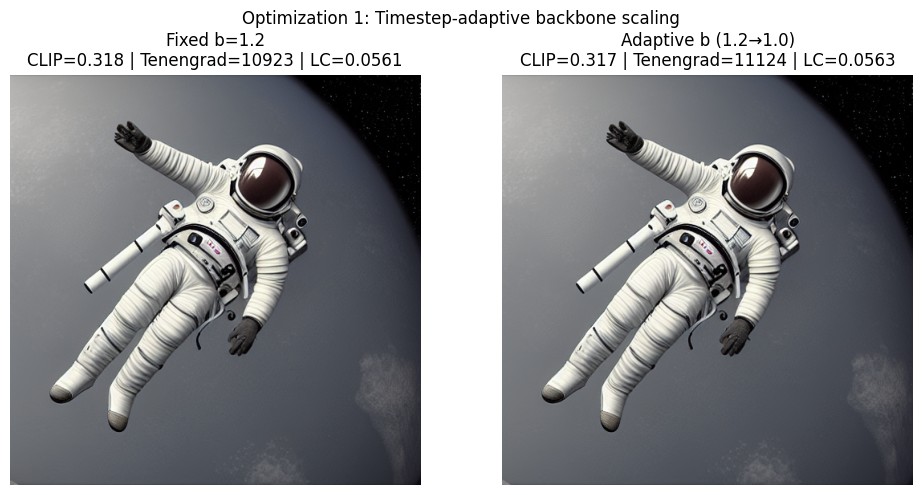


Fixed b    : {'clip_score': 0.3184, 'tenengrad': 10923.16, 'local_contrast': 0.0561, 'spectral_ratio': 0.9881}
Adaptive b : {'clip_score': 0.3168, 'tenengrad': 11123.74, 'local_contrast': 0.0563, 'spectral_ratio': 0.9878}


In [ ]:
# Cell 12: Adaptive b decay vs fixed b — our novel contribution

test_prompt = "an astronaut flying in outer space, photorealistic"

img_fixed,    _ = generate(test_prompt, use_freeu=True, adaptive_b=False)
img_adaptive, _ = generate(test_prompt, use_freeu=True, adaptive_b=True)

m_fixed    = compute_all_metrics(img_fixed,    test_prompt)
m_adaptive = compute_all_metrics(img_adaptive, test_prompt)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(img_fixed);    axes[0].axis("off")
axes[0].set_title(
    f"Fixed b=1.2\n"
    f"CLIP={m_fixed['clip_score']:.3f} | "
    f"Tenengrad={m_fixed['tenengrad']:.0f} | "
    f"LC={m_fixed['local_contrast']:.4f}"
)
axes[1].imshow(img_adaptive); axes[1].axis("off")
axes[1].set_title(
    f"Adaptive b (1.2→1.0)\n"
    f"CLIP={m_adaptive['clip_score']:.3f} | "
    f"Tenengrad={m_adaptive['tenengrad']:.0f} | "
    f"LC={m_adaptive['local_contrast']:.4f}"
)
fig.suptitle("Optimization 1: Timestep-adaptive backbone scaling", fontsize=12)
plt.tight_layout()
plt.savefig("results/plots/adaptive_b.png", dpi=150, bbox_inches="tight")
plt.show()

print("\nFixed b    :", m_fixed)
print("Adaptive b :", m_adaptive)

b=1.0, CFG=5.0 | CLIP=0.363 | Tenengrad=12852
b=1.0, CFG=7.5 | CLIP=0.363 | Tenengrad=11343
b=1.0, CFG=10.0 | CLIP=0.359 | Tenengrad=10073
b=1.0, CFG=12.5 | CLIP=0.358 | Tenengrad=9725
FreeU hooks removed, U-Net restored.
b=1.2, CFG=5.0 | CLIP=0.364 | Tenengrad=11783
FreeU hooks removed, U-Net restored.
b=1.2, CFG=7.5 | CLIP=0.366 | Tenengrad=12491
FreeU hooks removed, U-Net restored.
b=1.2, CFG=10.0 | CLIP=0.360 | Tenengrad=11525
FreeU hooks removed, U-Net restored.
b=1.2, CFG=12.5 | CLIP=0.351 | Tenengrad=11519
FreeU hooks removed, U-Net restored.
b=1.4, CFG=5.0 | CLIP=0.364 | Tenengrad=11724
FreeU hooks removed, U-Net restored.
b=1.4, CFG=7.5 | CLIP=0.366 | Tenengrad=12245
FreeU hooks removed, U-Net restored.
b=1.4, CFG=10.0 | CLIP=0.360 | Tenengrad=11309
FreeU hooks removed, U-Net restored.
b=1.4, CFG=12.5 | CLIP=0.351 | Tenengrad=11412


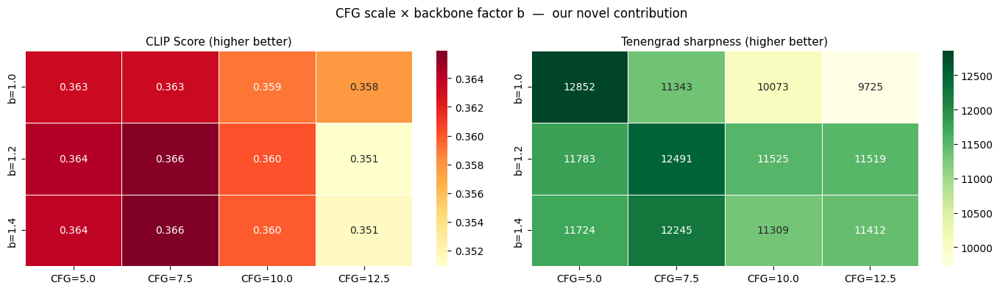

In [ ]:
# Cell 13: 2D grid — CFG scale vs b factor (novel contribution)

test_prompt = "a golden retriever puppy playing in autumn leaves"
cfg_scales  = [5.0, 7.5, 10.0, 12.5]
b_values    = [1.0, 1.2, 1.4]

grid_clip     = np.zeros((len(b_values), len(cfg_scales)))
grid_tenengrad = np.zeros((len(b_values), len(cfg_scales)))

for bi, b in enumerate(b_values):
    for ci, cfg in enumerate(cfg_scales):
        img, _ = generate(
            test_prompt,
            use_freeu=(b > 1.0),
            custom_b=[b, min(b * 1.1, 1.6), 1.0, 1.0],
            custom_s=[0.9, 0.2, 1.0, 1.0],
            guidance_scale=cfg,
        )
        m = compute_all_metrics(img, test_prompt)
        grid_clip[bi, ci]      = m["clip_score"]
        grid_tenengrad[bi, ci] = m["tenengrad"]
        print(f"b={b:.1f}, CFG={cfg:.1f} | "
              f"CLIP={m['clip_score']:.3f} | "
              f"Tenengrad={m['tenengrad']:.0f}")

fig, axes = plt.subplots(1, 2, figsize=(14, 4))

sns.heatmap(grid_clip,
            xticklabels=[f"CFG={c}" for c in cfg_scales],
            yticklabels=[f"b={b}" for b in b_values],
            annot=True, fmt=".3f", cmap="YlOrRd",
            ax=axes[0], linewidths=0.5, linecolor="white")
axes[0].set_title("CLIP Score (higher better)", fontsize=11)

sns.heatmap(grid_tenengrad,
            xticklabels=[f"CFG={c}" for c in cfg_scales],
            yticklabels=[f"b={b}" for b in b_values],
            annot=True, fmt=".0f", cmap="YlGn",
            ax=axes[1], linewidths=0.5, linecolor="white")
axes[1].set_title("Tenengrad sharpness (higher better)", fontsize=11)

fig.suptitle("CFG scale × backbone factor b  —  our novel contribution",
             fontsize=12)
plt.tight_layout()
plt.savefig("results/plots/cfg_b_heatmap.png", dpi=150, bbox_inches="tight")
plt.show()

In [ ]:
# Cell 14: Final summary report

import statistics

print("=" * 65)
print("FINAL RESULTS SUMMARY")
print("=" * 65)

metric_config = [
    ("clip_score",     "higher better", True),
    ("tenengrad",      "higher better", True),
    ("local_contrast", "higher better", True),
    ("spectral_ratio", "lower better",  False),
]

for mname, direction_label, higher_is_better in metric_config:
    sd_vals_list = [r["sd"][mname]    for r in results]
    fu_vals_list = [r["freeu"][mname] for r in results]
    sd_mean  = statistics.mean(sd_vals_list)
    fu_mean  = statistics.mean(fu_vals_list)
    delta    = fu_mean - sd_mean
    pct      = (delta / (sd_mean + 1e-8)) * 100
    better   = (delta > 0) if higher_is_better else (delta < 0)
    verdict  = "IMPROVED" if better else "no change / worse"

    print(f"\n{mname.upper()}  ({direction_label})")
    print(f"  SD baseline : {sd_mean:.4f}")
    print(f"  SD + FreeU  : {fu_mean:.4f}  ({pct:+.1f}%)  [{verdict}]")

print("\n" + "=" * 65)
print("Output files:")
print("  results/plots/gallery.png")
print("  results/plots/metrics_comparison.png")
print("  results/plots/fourier_analysis.png")
print("  results/plots/ablation.png")
print("  results/plots/adaptive_b.png")
print("  results/plots/cfg_b_heatmap.png")
print("  results/metrics/main_results.json")
print("=" * 65)

FINAL RESULTS SUMMARY

CLIP_SCORE  (higher better)
  SD baseline : 0.3268
  SD + FreeU  : 0.3226  (-1.3%)  [no change / worse]

TENENGRAD  (higher better)
  SD baseline : 7987.1713
  SD + FreeU  : 9367.2475  (+17.3%)  [IMPROVED]

LOCAL_CONTRAST  (higher better)
  SD baseline : 0.0580
  SD + FreeU  : 0.0657  (+13.3%)  [IMPROVED]

SPECTRAL_RATIO  (lower better)
  SD baseline : 0.9905
  SD + FreeU  : 0.9893  (-0.1%)  [IMPROVED]

Output files:
  results/plots/gallery.png
  results/plots/metrics_comparison.png
  results/plots/fourier_analysis.png
  results/plots/ablation.png
  results/plots/adaptive_b.png
  results/plots/cfg_b_heatmap.png
  results/metrics/main_results.json
